In [1]:
import mne
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from mne.viz import plot_alignment, snapshot_brain_montage
from scipy.stats import zscore
from teaspoon.parameter_selection.delay_LMS import AbsFFT
import scipy.io

In [2]:
# Load data from https://mni-open-ieegatlas.research.mcgill.ca/
rawpath = "MatlabFile.mat"
mat = scipy.io.loadmat(rawpath)

# Wakefulness

In [3]:
wake_data = mat['Data_W'].T
ggdat = []    
spdata = np.asarray(np.split(wake_data.T[0:12000],10))
allpts = []
for chan in range(spdata.shape[2]):
    curdat = spdata[:,:,chan]
    nbpts = []
    for ep in range(spdata.shape[0]):
        f, pts = AbsFFT(curdat[ep,:],fs=200)
        nbpts.append(pts)
    ggdat.append(np.mean(nbpts,0))

In [4]:
# zscore frequency according to all locations and remove 1/f by multiplying by sqrt of freq
data = zscore(np.vstack(ggdat)*np.sqrt(f),1)
# get frequency of max power below 50Hz
datas_to_plot2 = []
for i in data:
    cum_sum = np.cumsum(i[0:len(f[f<48])])
    datas_to_plot2.append(f[np.argmax(cum_sum >= cum_sum[-1] / 2)])

datas_to_plot2 = np.asarray(datas_to_plot2)
ch_names = mat['ChannelName']
ch_names = np.asarray([i[0][0] for i in ch_names])
loc_mm = mat['ChannelPosition']*1e-3
masko = np.where(np.logical_and(datas_to_plot2>4,datas_to_plot2<29))
datas_to_plot2 = datas_to_plot2[masko]
ch_names = ch_names[masko]
loc_mm = loc_mm[masko]

Using notebook 3d backend.

Channel types::	seeg: 1761


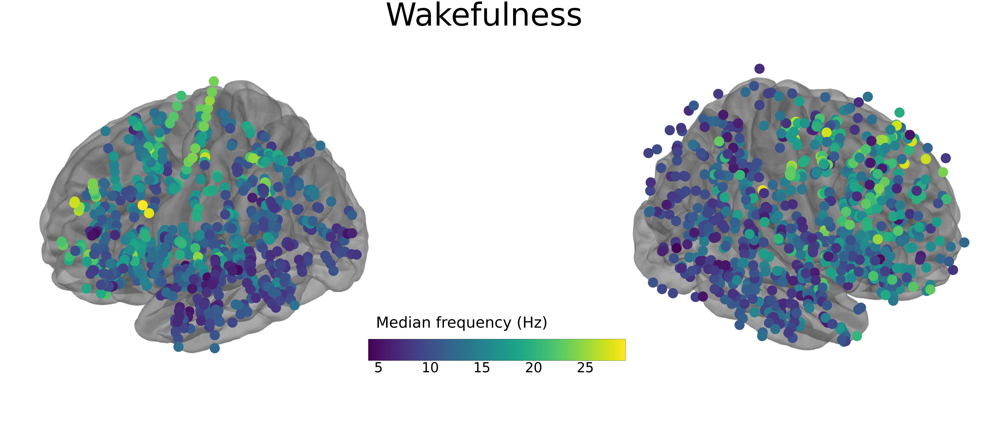

In [5]:
vmini = np.min(datas_to_plot2);
vmaxi =np.max(datas_to_plot2)

# Declare montage
ch_pos = dict(zip(ch_names, loc_mm))
montage = mne.channels.make_dig_montage(ch_pos=ch_pos, coord_frame='head')
info_ = mne.create_info(list(ch_names), 1000., ch_types='seeg').set_montage(montage)

mne.viz.set_3d_backend("notebook")
fig = mne.viz.create_3d_figure(size=(1000, 800), bgcolor='white', scene=True)
subjects_dir = "D:\\Documents\\new_projet_3\\data\\anatomy2\\"
subjects_dir ="C:\\Users\\Jeremy\\Documents\\RESEARCH\\projet_3_in_cambridge\\ScienceAdvancesBureau\\anatomy2\\"
trans =  mne.read_trans(subjects_dir + '\\fsaverage\\fsaverage-trans.fif')
surfaces = {'brain': 1}

fig =plot_alignment(info=info_,trans=trans,subject='fsaverage',subjects_dir=subjects_dir,
                 surfaces=['pial'],seeg=True, interaction='terrain',coord_frame='mri',fig=fig)

mne.viz.set_3d_view(fig,azimuth=-180, elevation=-70,distance = 0.37)
xy, im = snapshot_brain_montage(fig, montage)
xy_pts1 = np.vstack([xy[ch] for ch in info_['ch_names']])

mne.viz.set_3d_view(fig,azimuth=180, elevation=70,distance = 0.37)
xy,im2 = snapshot_brain_montage(fig, montage)
xy_pts2 = np.vstack([xy[ch] for ch in info_['ch_names']])


images = [im2,im]
fig2, axs = plt.subplots(1,2,figsize=(85, 32))

for i,(ax,image) in enumerate(zip(axs.ravel(),images)):
    if (i % 2) == 0:
        ax.imshow(image, aspect='auto') 
        mask3 = loc_mm[:, 0] < 0 # Data for electrodes in left hemisphere are set to np.nan
        sizes = np.repeat(2000,len(datas_to_plot2[mask3]))
        m = ax.scatter(*xy_pts2[mask3].T, c=datas_to_plot2[mask3], s=sizes, cmap="viridis", linewidths=3.6, alpha=1,vmin=vmini,vmax=vmaxi) 
    else:
        ax.imshow(image, aspect='auto')
        mask4 = loc_mm[:, 0] > 0 # Data for electrodes in left hemisphere are set to np.nan
        sizes=np.repeat(2000,len(datas_to_plot2[mask4]))
        m = ax.scatter(*xy_pts1[mask4].T, c=datas_to_plot2[mask4], s = sizes,cmap="viridis", linewidths=3.6, alpha=1,vmin=vmini ,vmax=vmaxi) 
    ax.set_axis_off()

cax3 = fig2.add_axes([0.41, 0.2, 0.2, 0.55])
cax3.set_axis_off()
cbar3 = plt.colorbar(m, ax=cax3, orientation='horizontal',aspect=12, pad=0)
cbar3.ax.tick_params(labelsize=65)
cax3.text(0.03,0.05,'Median frequency (Hz)',fontsize=72);
fig2.suptitle('Wakefulness',fontsize=150);

# REM 

In [6]:
REM_data = mat['Data_R'].T

In [7]:
ggdat = []    
spdata = np.asarray(np.split(REM_data.T[0:12000],10))
allpts = []
for chan in range(spdata.shape[2]):
    curdat = spdata[:,:,chan]
    nbpts = []
    for ep in range(spdata.shape[0]):
        f, pts = AbsFFT(curdat[ep,:],fs=200)
        nbpts.append(pts)
    ggdat.append(np.mean(nbpts,0))

In [8]:
# zscore frequency according to all locations and remove 1/f by multiplying by sqrt of freq
data = zscore(np.vstack(ggdat)*np.sqrt(f),1)
# get frequency of max power below 50Hz
datas_to_plot2 = []
for i in data:
    cum_sum = np.cumsum(i[0:len(f[f<48])])
    datas_to_plot2.append(f[np.argmax(cum_sum >= cum_sum[-1] / 2)])

datas_to_plot2 = np.asarray(datas_to_plot2)
ch_names = mat['ChannelName']
ch_names = np.asarray([i[0][0] for i in ch_names])
loc_mm = mat['ChannelPosition']*1e-3
masko = datas_to_plot2>2
datas_to_plot2 = datas_to_plot2[masko]
ch_names = ch_names[masko]
loc_mm = loc_mm[masko]

Channel types::	seeg: 1007


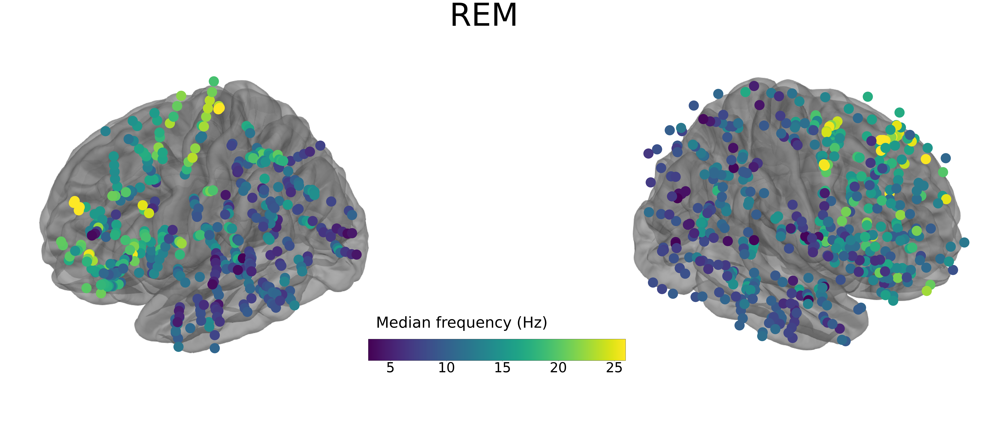

In [9]:

vmini = np.min(datas_to_plot2);
vmaxi = 26

# Declare montage
ch_pos = dict(zip(ch_names, loc_mm))
montage = mne.channels.make_dig_montage(ch_pos=ch_pos, coord_frame='head')
info_ = mne.create_info(list(ch_names), 1000., ch_types='seeg').set_montage(montage)


mne.viz.set_3d_backend("notebook")
fig = mne.viz.create_3d_figure(size=(1000, 800), bgcolor='white', scene=True)
subjects_dir = "D:\\Documents\\new_projet_3\\data\\anatomy2\\"
subjects_dir ="C:\\Users\\Jeremy\\Documents\\RESEARCH\\projet_3_in_cambridge\\ScienceAdvancesBureau\\anatomy2\\"
trans =  mne.read_trans(subjects_dir + '\\fsaverage\\fsaverage-trans.fif')
surfaces = {'brain': 1}

fig =plot_alignment(info=info_,trans=trans,subject='fsaverage',subjects_dir=subjects_dir,
                 surfaces=['pial'],seeg=True, interaction='terrain',coord_frame='mri',fig=fig)



mne.viz.set_3d_view(fig,azimuth=-180, elevation=-70,distance = 0.37)
xy, im = snapshot_brain_montage(fig, montage)
xy_pts1 = np.vstack([xy[ch] for ch in info_['ch_names']])

mne.viz.set_3d_view(fig,azimuth=180, elevation=70,distance = 0.37)
xy,im2 = snapshot_brain_montage(fig, montage)
xy_pts2 = np.vstack([xy[ch] for ch in info_['ch_names']])


images = [im2,im]
fig2, axs = plt.subplots(1,2,figsize=(85, 32))

for i,(ax,image) in enumerate(zip(axs.ravel(),images)):
    if (i % 2) == 0:
        ax.imshow(image, aspect='auto') 
        mask3 = loc_mm[:, 0] < 0 # Data for electrodes in left hemisphere are set to np.nan
        sizes = np.repeat(2000,len(datas_to_plot2[mask3]))
        m = ax.scatter(*xy_pts2[mask3].T, c=datas_to_plot2[mask3], s=sizes, cmap="viridis", linewidths=3.6, alpha=1,vmin=vmini,vmax=vmaxi) 
    else:
        ax.imshow(image, aspect='auto')
        mask4 = loc_mm[:, 0] > 0 # Data for electrodes in left hemisphere are set to np.nan
        sizes=np.repeat(2000,len(datas_to_plot2[mask4]))
        m = ax.scatter(*xy_pts1[mask4].T, c=datas_to_plot2[mask4], s = sizes,cmap="viridis", linewidths=3.6, alpha=1,vmin=vmini ,vmax=vmaxi) 
    ax.set_axis_off()

cax3 = fig2.add_axes([0.41, 0.2, 0.2, 0.55])
cax3.set_axis_off()
cbar3 = plt.colorbar(m, ax=cax3, orientation='horizontal',aspect=12, pad=0)
cbar3.ax.tick_params(labelsize=65)
cax3.text(0.03,0.05,'Median frequency (Hz)',fontsize=72);
fig2.suptitle('REM',fontsize=150);

# N2

In [10]:
N2_data = mat['Data_N2'].T

In [11]:
ggdat = []    
spdata = np.asarray(np.split(N2_data.T[0:12000],10))
allpts = []
for chan in range(spdata.shape[2]):
    curdat = spdata[:,:,chan]
    nbpts = []
    for ep in range(spdata.shape[0]):
        f, pts = AbsFFT(curdat[ep,:],fs=200)
        nbpts.append(pts)
    ggdat.append(np.mean(nbpts,0))

In [12]:
# zscore frequency according to all locations and remove 1/f by multiplying by sqrt of freq
data = zscore(np.vstack(ggdat)*np.sqrt(f),1)
# get frequency of max power below 50Hz
datas_to_plot2 = []
for i in data:
    cum_sum = np.cumsum(i[0:len(f[f<48])])
    datas_to_plot2.append(f[np.argmax(cum_sum >= cum_sum[-1] / 2)])

datas_to_plot2 = np.asarray(datas_to_plot2)
ch_names = mat['ChannelName']
ch_names = np.asarray([i[0][0] for i in ch_names])
loc_mm = mat['ChannelPosition']*1e-3
masko = datas_to_plot2>2
datas_to_plot2 = datas_to_plot2[masko]
ch_names = ch_names[masko]
loc_mm = loc_mm[masko]

Channel types::	seeg: 1467


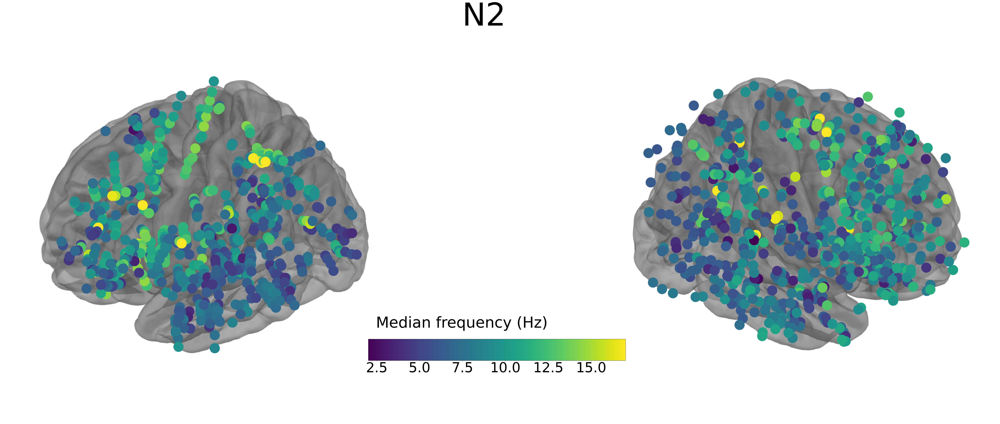

In [13]:
vmini = np.min(datas_to_plot2);
vmaxi = 17

# Declare montage
ch_pos = dict(zip(ch_names, loc_mm))
montage = mne.channels.make_dig_montage(ch_pos=ch_pos, coord_frame='head')
info_ = mne.create_info(list(ch_names), 1000., ch_types='seeg').set_montage(montage)


mne.viz.set_3d_backend("notebook")
fig = mne.viz.create_3d_figure(size=(1000, 800), bgcolor='white', scene=True)
subjects_dir = "D:\\Documents\\new_projet_3\\data\\anatomy2\\"
subjects_dir ="C:\\Users\\Jeremy\\Documents\\RESEARCH\\projet_3_in_cambridge\\ScienceAdvancesBureau\\anatomy2\\"
trans =  mne.read_trans(subjects_dir + '\\fsaverage\\fsaverage-trans.fif')
surfaces = {'brain': 1}

fig =plot_alignment(info=info_,trans=trans,subject='fsaverage',subjects_dir=subjects_dir,
                 surfaces=['pial'],seeg=True, interaction='terrain',coord_frame='mri',fig=fig)



mne.viz.set_3d_view(fig,azimuth=-180, elevation=-70,distance = 0.37)
xy, im = snapshot_brain_montage(fig, montage)
xy_pts1 = np.vstack([xy[ch] for ch in info_['ch_names']])

mne.viz.set_3d_view(fig,azimuth=180, elevation=70,distance = 0.37)
xy,im2 = snapshot_brain_montage(fig, montage)
xy_pts2 = np.vstack([xy[ch] for ch in info_['ch_names']])


images = [im2,im]
fig2, axs = plt.subplots(1,2,figsize=(85, 32))

for i,(ax,image) in enumerate(zip(axs.ravel(),images)):
    if (i % 2) == 0:
        ax.imshow(image, aspect='auto') 
        mask3 = loc_mm[:, 0] < 0 # Data for electrodes in left hemisphere are set to np.nan
        sizes = np.repeat(2000,len(datas_to_plot2[mask3]))
        m = ax.scatter(*xy_pts2[mask3].T, c=datas_to_plot2[mask3], s=sizes, cmap="viridis", linewidths=3.6, alpha=1,vmin=vmini,vmax=vmaxi) 
    else:
        ax.imshow(image, aspect='auto')
        mask4 = loc_mm[:, 0] > 0 # Data for electrodes in left hemisphere are set to np.nan
        sizes=np.repeat(2000,len(datas_to_plot2[mask4]))
        m = ax.scatter(*xy_pts1[mask4].T, c=datas_to_plot2[mask4], s = sizes,cmap="viridis", linewidths=3.6, alpha=1,vmin=vmini ,vmax=vmaxi) 
    ax.set_axis_off()

cax3 = fig2.add_axes([0.41, 0.2, 0.2, 0.55])
cax3.set_axis_off()
cbar3 = plt.colorbar(m, ax=cax3, orientation='horizontal',aspect=12, pad=0)
cbar3.ax.tick_params(labelsize=65)
cax3.text(0.03,0.05,'Median frequency (Hz)',fontsize=72);
fig2.suptitle('N2',fontsize=150);

# N3

In [14]:
N3_data = mat['Data_N3'].T

In [15]:
ggdat = []    
spdata = np.asarray(np.split(N3_data.T[0:12000],10))
allpts = []
for chan in range(spdata.shape[2]):
    curdat = spdata[:,:,chan]
    nbpts = []
    for ep in range(spdata.shape[0]):
        f, pts = AbsFFT(curdat[ep,:],fs=200)
        nbpts.append(pts)
    ggdat.append(np.mean(nbpts,0))

In [16]:
# zscore frequency according to all locations and remove 1/f by multiplying by sqrt of freq
data = zscore(np.vstack(ggdat)*np.sqrt(f),1)
# get frequency of max power below 50Hz
datas_to_plot2 = []
for i in data:
    cum_sum = np.cumsum(i[0:len(f[f<48])])
    datas_to_plot2.append(f[np.argmax(cum_sum >= cum_sum[-1] / 2)])

datas_to_plot2 = np.asarray(datas_to_plot2)
ch_names = mat['ChannelName']
ch_names = np.asarray([i[0][0] for i in ch_names])
loc_mm = mat['ChannelPosition']*1e-3
masko = np.where(np.logical_and(datas_to_plot2>1.5,datas_to_plot2<12.5))
datas_to_plot2 = datas_to_plot2[masko]
ch_names = ch_names[masko]
loc_mm = loc_mm[masko]

Channel types::	seeg: 1459


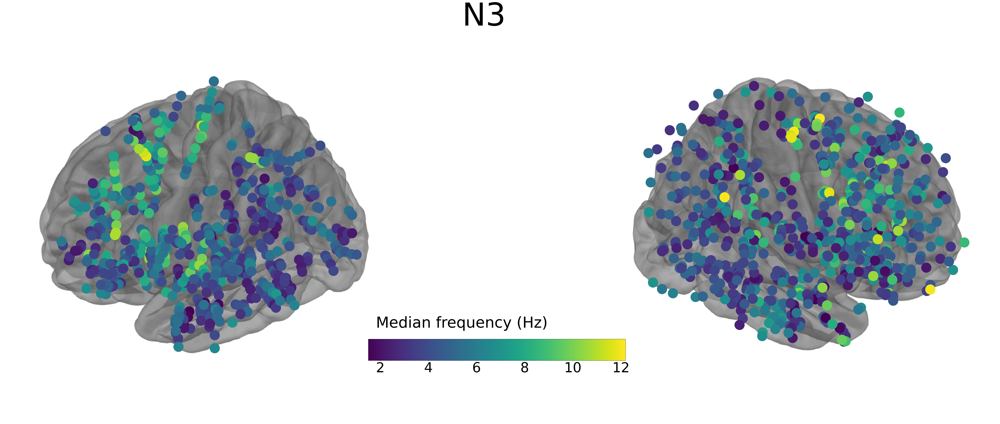

In [17]:
vmini = np.min(datas_to_plot2);
vmaxi = np.max(datas_to_plot2);

# Declare montage
ch_pos = dict(zip(ch_names, loc_mm))
montage = mne.channels.make_dig_montage(ch_pos=ch_pos, coord_frame='head')
info_ = mne.create_info(list(ch_names), 1000., ch_types='seeg').set_montage(montage)


mne.viz.set_3d_backend("notebook")
fig = mne.viz.create_3d_figure(size=(1000, 800), bgcolor='white', scene=True)
subjects_dir = "D:\\Documents\\new_projet_3\\data\\anatomy2\\"
subjects_dir ="C:\\Users\\Jeremy\\Documents\\RESEARCH\\projet_3_in_cambridge\\ScienceAdvancesBureau\\anatomy2\\"
trans =  mne.read_trans(subjects_dir + '\\fsaverage\\fsaverage-trans.fif')
surfaces = {'brain': 1}

fig =plot_alignment(info=info_,trans=trans,subject='fsaverage',subjects_dir=subjects_dir,
                 surfaces=['pial'],seeg=True, interaction='terrain',coord_frame='mri',fig=fig)



mne.viz.set_3d_view(fig,azimuth=-180, elevation=-70,distance = 0.37)
xy, im = snapshot_brain_montage(fig, montage)
xy_pts1 = np.vstack([xy[ch] for ch in info_['ch_names']])

mne.viz.set_3d_view(fig,azimuth=180, elevation=70,distance = 0.37)
xy,im2 = snapshot_brain_montage(fig, montage)
xy_pts2 = np.vstack([xy[ch] for ch in info_['ch_names']])


images = [im2,im]
fig2, axs = plt.subplots(1,2,figsize=(85, 32))

for i,(ax,image) in enumerate(zip(axs.ravel(),images)):
    if (i % 2) == 0:
        ax.imshow(image, aspect='auto') 
        mask3 = loc_mm[:, 0] < 0 # Data for electrodes in left hemisphere are set to np.nan
        sizes = np.repeat(2000,len(datas_to_plot2[mask3]))
        m = ax.scatter(*xy_pts2[mask3].T, c=datas_to_plot2[mask3], s=sizes, cmap="viridis", linewidths=3.6, alpha=1,vmin=vmini,vmax=vmaxi) 
    else:
        ax.imshow(image, aspect='auto')
        mask4 = loc_mm[:, 0] > 0 # Data for electrodes in left hemisphere are set to np.nan
        sizes=np.repeat(2000,len(datas_to_plot2[mask4]))
        m = ax.scatter(*xy_pts1[mask4].T, c=datas_to_plot2[mask4], s = sizes,cmap="viridis", linewidths=3.6, alpha=1,vmin=vmini ,vmax=vmaxi) 
    ax.set_axis_off()

cax3 = fig2.add_axes([0.41, 0.2, 0.2, 0.55])
cax3.set_axis_off()
cbar3 = plt.colorbar(m, ax=cax3, orientation='horizontal',aspect=12, pad=0)
cbar3.ax.tick_params(labelsize=65)
cax3.text(0.03,0.05,'Median frequency (Hz)',fontsize=72);
fig2.suptitle('N3',fontsize=150);